With GridMethod.jl we can solve real polynomial systems....


In [1]:
import Pkg
Pkg.add("HomotopyContinuation")
Pkg.add("Plots")

   Resolving package versions...
  No Changes to `~/Dropbox/GitHubGalois/GridMethod.jl/Project.toml`
  No Changes to `~/Dropbox/GitHubGalois/GridMethod.jl/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Dropbox/GitHubGalois/GridMethod.jl/Project.toml`
  No Changes to `~/Dropbox/GitHubGalois/GridMethod.jl/Manifest.toml`


In [2]:
using .Iterators
using Test
using LinearAlgebra
using GridMethod.Polynomial
using GridMethod.Norms
using GridMethod.ConditionNumbers
const CN = ConditionNumbers
using GridMethod.GridModule
using GridMethod.Han
using GridMethod.Coordinates
using GridMethod
using HomotopyContinuation
using Plots

In [3]:
import HomotopyContinuation.ModelKit
const HCMK = ModelKit

HomotopyContinuation.ModelKit

In [4]:
using Plots

function gridGroupByDepth(G::Grid{T, dim}) where {T, dim}
    I = unique(sort(depth.(G)))
    out = Dict(I .=> [empty(G) for _ in I ])
    for g in G
        d = depth(g)
        push!(out[d], g)
    end
    return out
end

xyAxes(G) = eachrow(reduce(hcat, map(coordinates, gridnodes(G))))

@recipe function f(G::Grid{Float64,2};
                   r = 2,
                   R = 20,
                   f_ms = i -> r + R*(.5)^i, # Marker size
                   f_ma = (d, dmin, dmax) -> (d - dmin + 1)/(dmax - dmin + 1), # Mark alpha/opacity
                   f_msw = (d, dmin, dmax) -> r/10 + (1 - f_ma(d, dmin, dmax))/r, # Border width (0 = No border)
                   color = "rgb(238,37,35)"
                   )
    Dict_depth = gridGroupByDepth(G)
    I = sort!(collect(keys(Dict_depth))) # Sort it for the legend
    dmin = first(I)
    dmax = last(I)
    # Set default values
    # axis --> ([-1.1,1.1],)
    ticks --> nothing
    xaxis --> false
    yaxis --> false
    aspect_ratio --> 1
    legend --> :outerright
    legendfontsize --> 10
    thickness_scaling --> 1
    shift = dmin -1
    # Plot each depth group
    for d in I
        x, y = xyAxes(Dict_depth[d])
        @series begin
            seriestype := :scatter
            label := "Depth $d"
            # markershape := :circle
            ms := f_ms(d - shift) # Mark size
            mc := color # Mark color
            ma := f_ma(d, dmin, dmax) # Mark alpha/opacity
            msw := f_msw(d, dmin, dmax) # Border/stroke width
            # msw := 0 # No border/stroke
            msc := color # Border color
            msa := f_ma(d, dmin, dmax)/r # Border alpha
            x, y
        end
    end
end

In [8]:
function exclusion(G::Grid{T, dim},P::HCMK.System) where {T, dim}
    approxgrid=Grid{Float64, 2}(G.polysys, [], nothing)
    n1=sum(abs.(HCMK.coefficients(P.expressions[1],[x,y])))
    n2=sum(abs.(HCMK.coefficients(P.expressions[2],[x,y])))
    for g in G.gridnodes
        if(2^depth(g)*g.image[1]/(n1*G.polysys.degrees[1])<=1 && 2^depth(g)*g.image[2]/(n2*G.polysys.degrees[2])<=1)
            Base.push!(approxgrid,g)
        end
    end
    return approxgrid
end

function _convertHCMKDegreesToPolynomial(degrees::Vector{Matrix{T}}) where T
    return [
        collect(eachcol(M))
        for M in degrees
    ]
end

_convertHCMKDegreesToPolynomial (generic function with 1 method)

In [9]:
HCMK.@var x,y

polysys = HCMK.System(
    [
        HCMK.rand_poly(Float64,[x,y],5),
        HCMK.rand_poly(Float64,[x,y],3),
    ];
    variables=[x,y]
    )
jacobian = v -> HCMK.jacobian(polysys, v)

gridPolySys::PolynomialSystem{Float64} =
    PolynomialSystem{Float64}(
        v -> polysys(v),
        jacobian,
        HCMK.degrees(polysys),
        HCMK.support_coefficients(polysys)[2],
        _convertHCMKDegreesToPolynomial(HCMK.support_coefficients(polysys)[1])
    )
grid = Grid{Float64, 2}(gridPolySys, [], nothing)
gridHan!(grid,UInt(1);maxDepth=UInt(15))

328.4021197357553

In [45]:
g1=grid.gridnodes[1]

GridNode{Float64, 2}(0x0000000000000004, [-0.875, 0.625], [1.2951142906435242, -4.339973532344217], [-2.7221630319707675 1.121769630223518; 6.732789564049245 -3.134407070632961], 7.58267088614396)

In [46]:
g1.image

2-element Vector{Float64}:
  1.2951142906435242
 -4.339973532344217

In [47]:
polysys(g1.coordinates)

2-element Vector{Float64}:
  1.2951142906435242
 -4.339973532344217

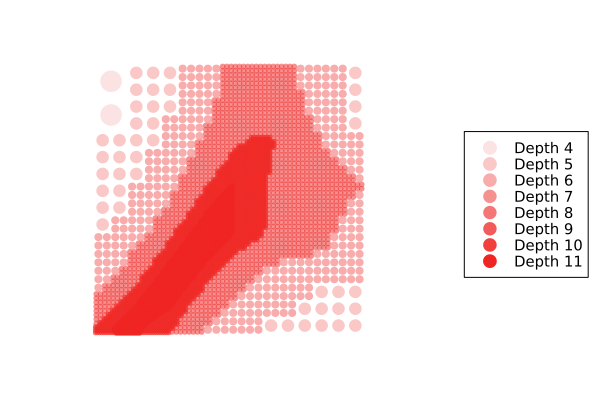

In [48]:
plot(grid)

In [49]:
normed_polysys = HCMK.System(
    [
        polysys.expressions[1]/sum(abs.(HCMK.coefficients(polysys.expressions[1],[x,y]))),
        polysys.expressions[2]/sum(abs.(HCMK.coefficients(polysys.expressions[2],[x,y])))
    ];
    variables=[x,y]
    )
normed_jacobian = v -> HCMK.jacobian(normed_polysys, v)

gridNormedPolySys::PolynomialSystem{Float64} =
    PolynomialSystem{Float64}(
        v -> normed_polysys(v),
        normed_jacobian,
        HCMK.degrees(normed_polysys),
        HCMK.support_coefficients(normed_polysys)[2]
    )
normed_grid = Grid{Float64, 2}(gridNormedPolySys, [], nothing)
gridHan!(normed_grid,UInt(1);maxDepth=UInt(15))

828.958686231572

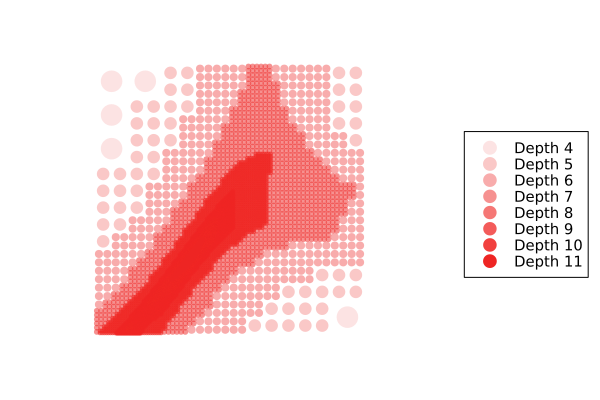

In [50]:
plot(normed_grid)

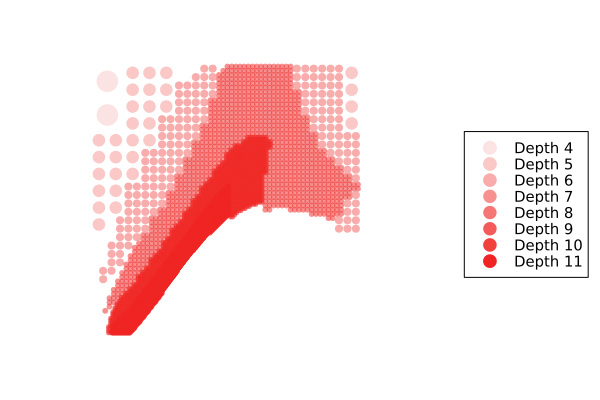

In [51]:
approx=exclusion(grid,polysys)
plot(approx)

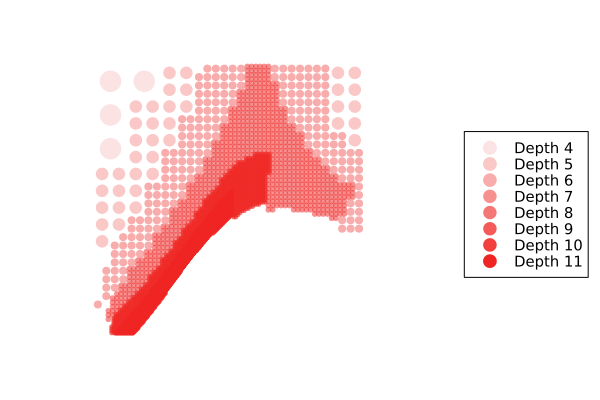

In [52]:
normed_approx=exclusion(normed_grid,normed_polysys)
plot(normed_approx)